In [2]:
from anndata import AnnData
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
sc.logging.print_header()
import pandas as pd
plt.rcParams.update({'font.size': 20})

ModuleNotFoundError: No module named 'anndata'

In [2]:
counts=sc.read_csv("C:/Users/lbinan/Desktop/tumor/morecells/merfishgoodCells.csv")#this is norm area and filter between 2000 and 30000 amd 40 and 400
countswithnames=sc.read_csv("C:/Users/lbinan/Desktop/tumor/morecells/merfishgoodCellsWithGeneName.csv")
perturbations=sc.read_csv("C:/Users/lbinan/Desktop/tumor/morecells/perturbationIDx.csv")

coordinates=sc.read_csv("C:/Users/lbinan/Desktop/tumor/morecells/positionsgoodcells2.csv")


In [3]:
coordinates=sc.read_csv("C:/Users/lbinan/Desktop/tumor/morecells/positionsgoodcells.csv")


In [4]:
adata = AnnData(counts.X, obsm={"spatial": coordinates.X})
adata.var=countswithnames.var.copy()
adata.obsm={"spatial": coordinates.X}
adata.obs['Cell_ID'] = [f"{i+1:d}" for i in range(adata.n_obs)]
adata.obs['total_counts'] = adata.X.sum(1)
adata.obs['perturbation']=perturbations.X[:,1]
adata.var=countswithnames.var.copy()


In [5]:
adata.obsm={"spatial": coordinates.X}

In [6]:
adata.obs['perturbation']=adata.obs['perturbation']

In [7]:
#adata = AnnData(counts.X, obsm={"spatial": coordinates.X})
#adata.var=countswithnames.var.copy()
#adata.obsm={"spatial": coordinates.X}
#areas=sc.read_csv("C:/Users/lbinan/Desktop/tumor/areaMerfish.csv")
#adata.obs['cellsize']=areas.X[:,1]
#adata.obs['total_counts'] = adata.X.sum(1)
#adata.var=countswithnames.var.copy()
adataOrigin=adata.copy()
adataOrigin.write("C:/Users/lbinan/Desktop/tumor/morecells/merfishnormedtoareaandfiltered.h5ad")
adata=adata.copy()
adata

AnnData object with n_obs × n_vars = 153705 × 500
    obs: 'Cell_ID', 'total_counts', 'perturbation'
    obsm: 'spatial'

In [8]:
adata=adataOrigin.copy()

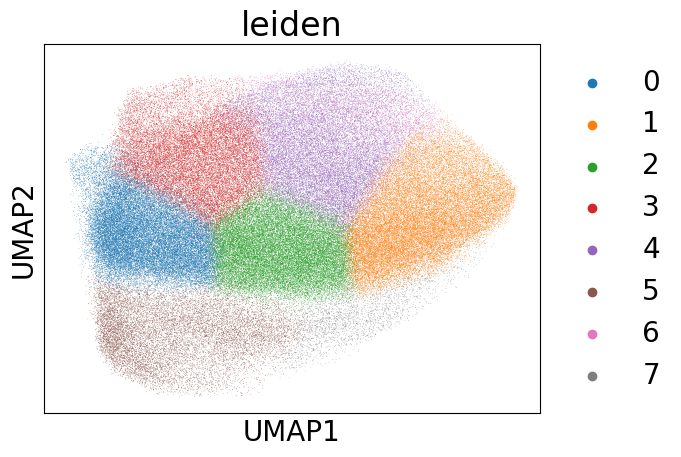

In [9]:
adata=adataOrigin.copy()
sc.pp.log1p(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)
sc.pl.umap(adata, color=["leiden"])


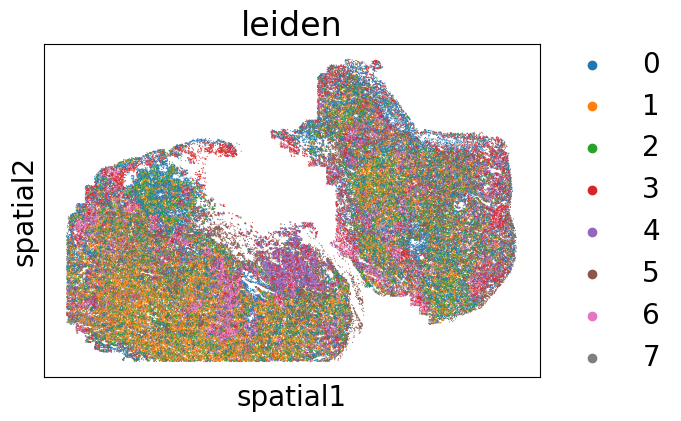

In [10]:
sc.pl.spatial(adata, color="leiden", spot_size=200)

In [11]:
sizes=np.multiply(perturbations.X[:,1].astype('float')>0,1)

In [82]:
adata.obs['perturbation']=adata.obs['perturbation'].astype('str')
adata.obs['perturbation']=adata.obs['perturbation'].astype('category')
adata.obs['perturbation']

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
153700    0.0
153701    0.0
153702    0.0
153703    0.0
153704    0.0
Name: perturbation, Length: 153705, dtype: category
Categories (37, object): ['0.0', '1.0', '10.0', '11.0', ..., '6.0', '7.0', '8.0', '9.0']

In [83]:
adata.obs["perturbationNames"] = adata.obs["perturbation"].map(
    {
        "0.0": "Unindentified",
        "1.0": "CD14",
        "2.0": "CHUK",
        "3.0": "IKBKB",
"4.0": "IRAK1",
"5.0": "IRAK4",
"6.0": "IRF3",
"7.0": "IRF5",
"8.0": "IRF7",
"9.0": "JUN",
"10.0": "LBP",
"11.0": "LY96",
"12.0": "MAP2K1",
"13.0": "MAP2K2",
"14.0": "MAP2K3",
"15.0": "MAP2K4",
"16.0": "MAP2K6",
"17.0": "MAP2K7",
"18.0": "MAP3K7",
"19.0": "MAPK14",
"20.0": "MYD88",
"21.0": "NFKB1",
"22.0": "NFKBIA",
"23.0": "PELI1",
"24.0": "PIK3CA",
"25.0": "RELA",
"26.0": "RIPK1",
"27.0": "TAB1",
"28.0": "TAB2",
"29.0": "TBK1",
"30.0": "TICAM1",
"31.0": "TIRAP",
"32.0": "TLR4",
"33.0": "TRADD",
"34.0": "TRAF6",
"35.0": "TRAM1",
"36.0": "Control"
    }
)
adata.obs["perturbationNames"]

0         Unindentified
1         Unindentified
2         Unindentified
3         Unindentified
4         Unindentified
              ...      
153700    Unindentified
153701    Unindentified
153702    Unindentified
153703    Unindentified
153704    Unindentified
Name: perturbationNames, Length: 153705, dtype: category
Categories (37, object): ['Unindentified', 'CD14', 'LBP', 'LY96', ..., 'IRF3', 'IRF5', 'IRF7', 'JUN']

In [84]:
adata.obs['sizes']=100+500*sizes

In [85]:
adata.obs['sizes']

0         100
1         100
2         100
3         100
4         100
         ... 
153700    100
153701    100
153702    100
153703    100
153704    100
Name: sizes, Length: 153705, dtype: int32

Trying to set attribute `.uns` of view, copying.


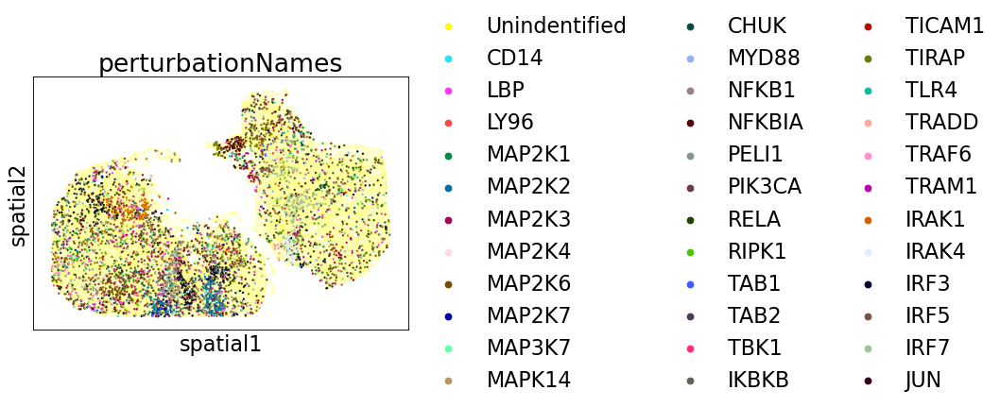

In [103]:
thisfig=sc.pl.spatial(adata[perturbations.X[:,1].astype('float')<36,:], color="perturbationNames", spot_size=100+500*sizes[perturbations.X[:,1].astype('float')<36], save=True)
sc.set_figure_params(thisfig, figsize=None, dpi=80, dpi_save=150, format='pdf', fontsize=14)

Trying to set attribute `.uns` of view, copying.


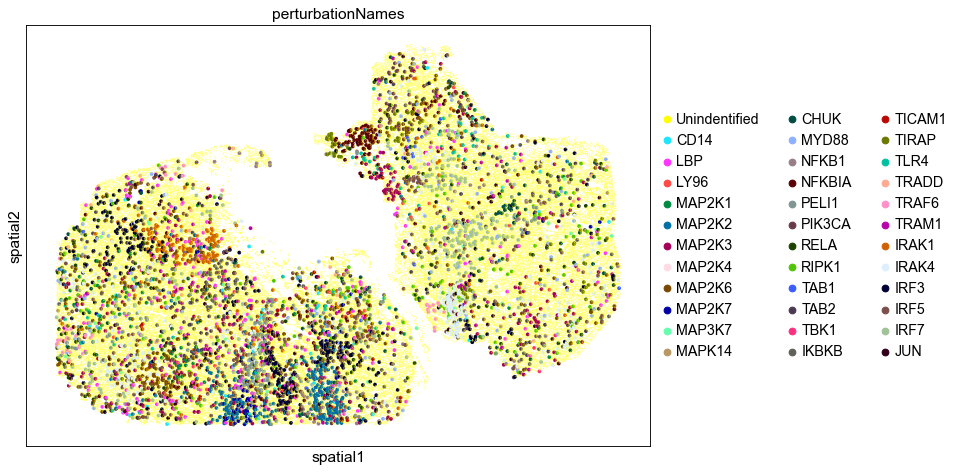

In [109]:
sc.set_figure_params(figsize=(10, 10))
sc.pl.spatial(adata[perturbations.X[:,1].astype('float')<36,:], color="perturbationNames", spot_size=100+500*sizes[perturbations.X[:,1].astype('float')<36], save=True)


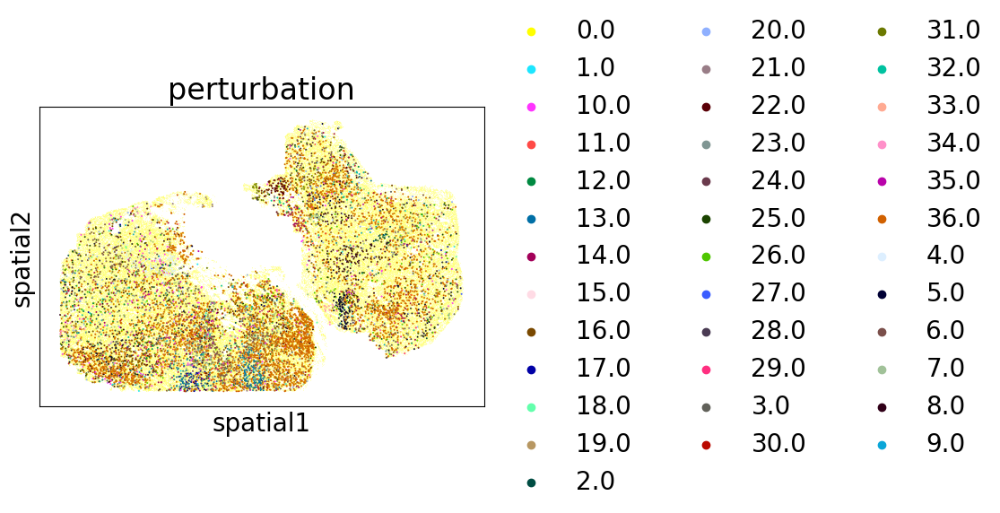

In [18]:
sc.pl.spatial(adata, color="perturbation", spot_size=100+300*sizes)

Trying to set attribute `.uns` of view, copying.


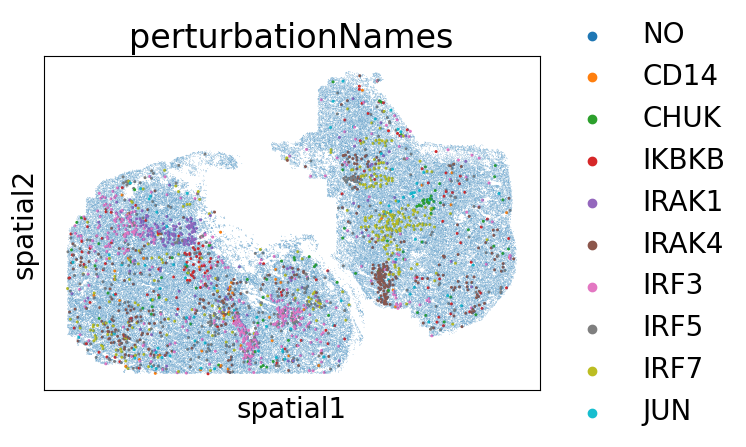

In [19]:
sc.pl.spatial(adata[perturbations.X[:,1].astype('float')<10,:], color="perturbationNames", spot_size=100+500*sizes[perturbations.X[:,1].astype('float')<10])

Trying to set attribute `.uns` of view, copying.


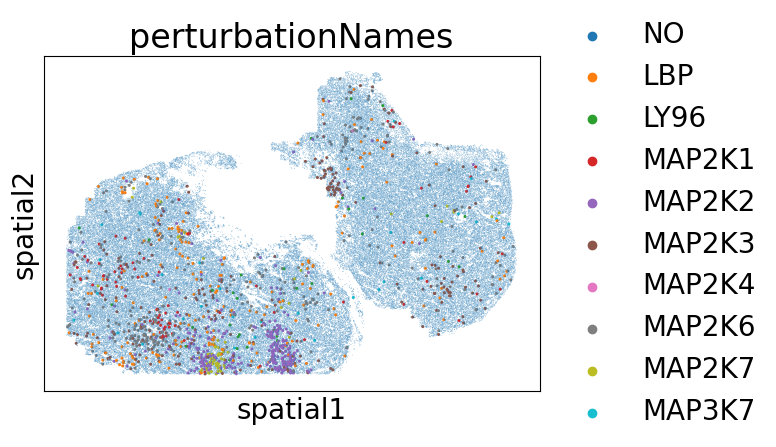

In [20]:
sc.pl.spatial(adata[(perturbations.X[:,1].astype('float')==0)|(perturbations.X[:,1].astype('float')>9) & (perturbations.X[:,1].astype('float')<19),:], color="perturbationNames", spot_size=100+500*sizes[(perturbations.X[:,1].astype('float')==0)|(perturbations.X[:,1].astype('float')>9) & (perturbations.X[:,1].astype('float')<19)])

Trying to set attribute `.uns` of view, copying.


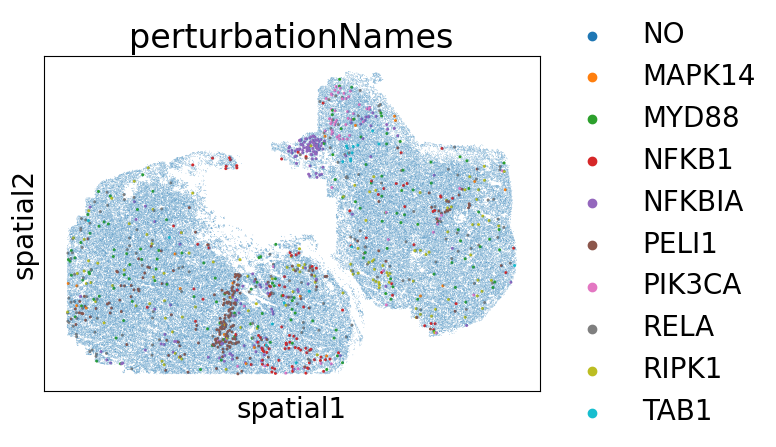

In [21]:
sc.pl.spatial(adata[(perturbations.X[:,1].astype('float')==0)|(perturbations.X[:,1].astype('float')>18) & (perturbations.X[:,1].astype('float')<28),:], color="perturbationNames", spot_size=100+500*sizes[(perturbations.X[:,1].astype('float')==0)|(perturbations.X[:,1].astype('float')>18) & (perturbations.X[:,1].astype('float')<28)])

Trying to set attribute `.uns` of view, copying.


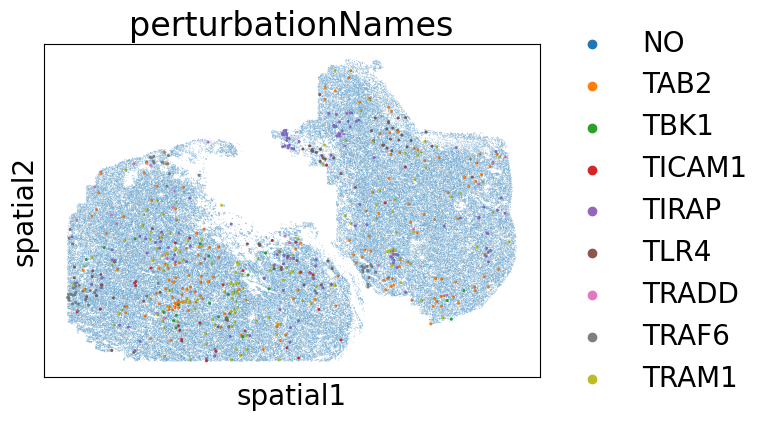

In [22]:
sc.pl.spatial(adata[(perturbations.X[:,1].astype('float')==0)|(perturbations.X[:,1].astype('float')>27) & (perturbations.X[:,1].astype('float')<36),:], color="perturbationNames", spot_size=100+500*sizes[(perturbations.X[:,1].astype('float')==0)|(perturbations.X[:,1].astype('float')>27) & (perturbations.X[:,1].astype('float')<36)])

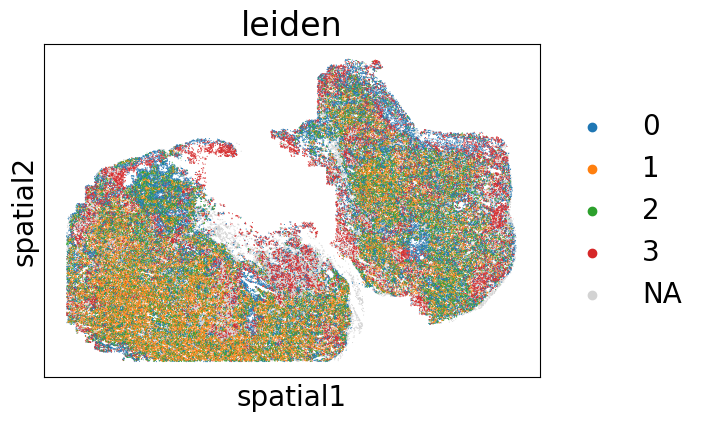

In [23]:
sc.pl.spatial(
    adata,
    color="leiden",
    groups=[
        "0","1","2","3"
    ],
    spot_size=200,
)

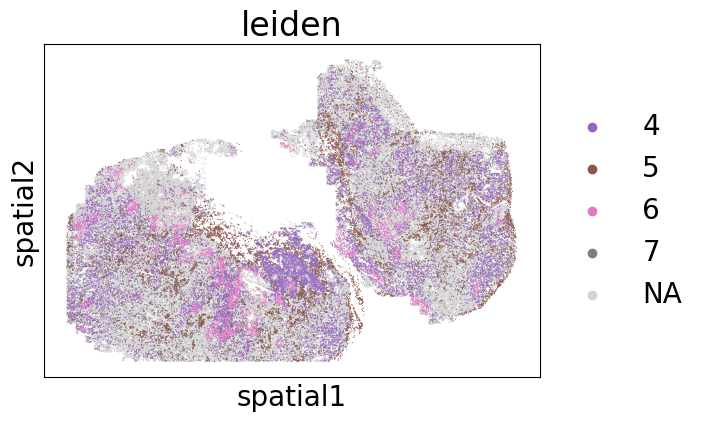

In [24]:
sc.pl.spatial(
    adata,
    color="leiden",
    groups=[
        "4","5","6","7"
    ],
    spot_size=200,
)

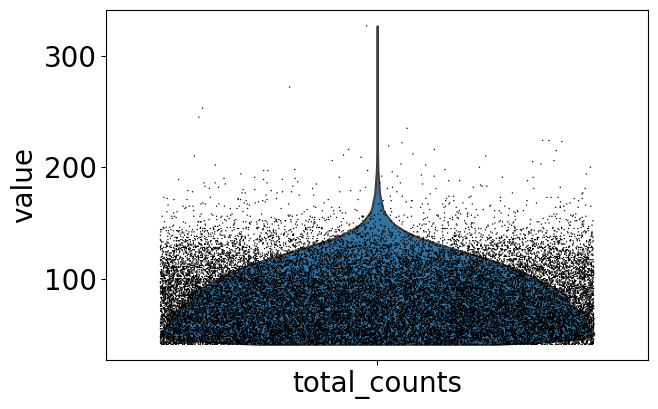

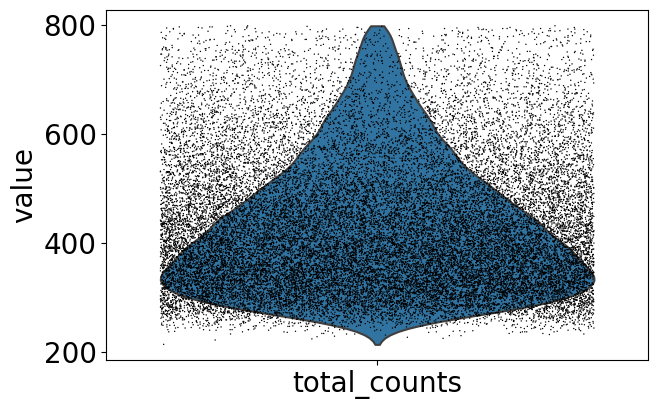

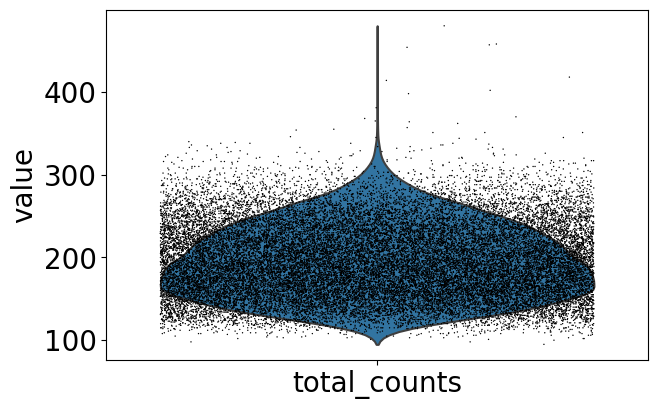

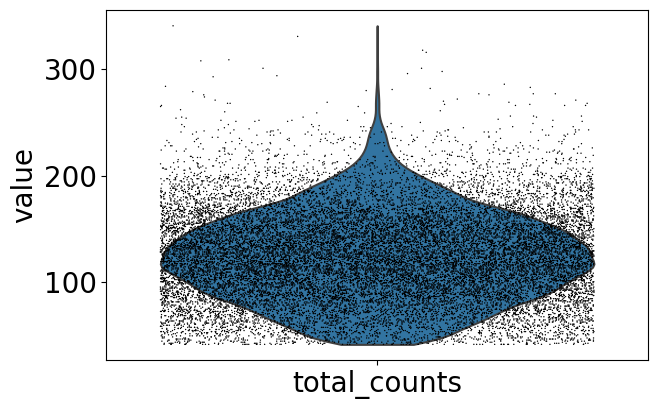

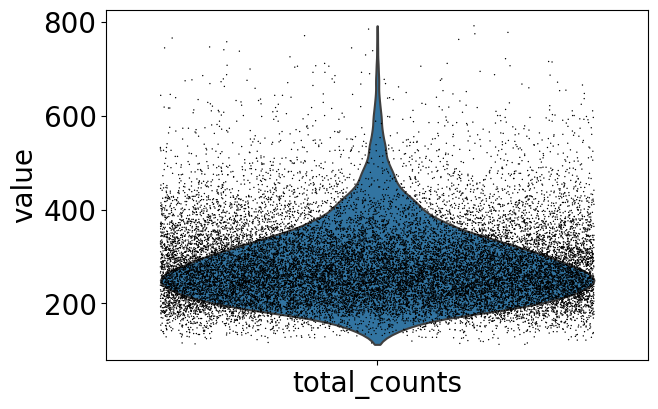

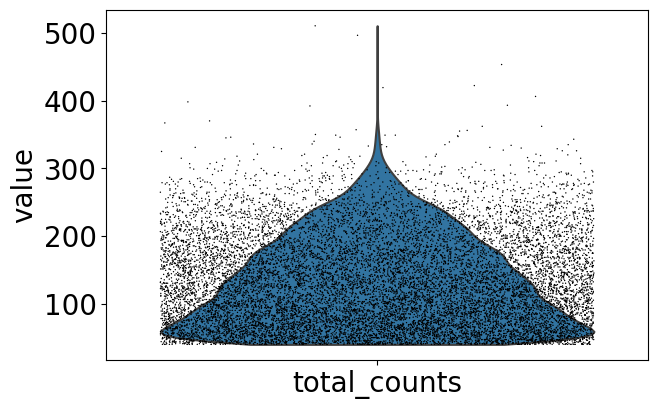

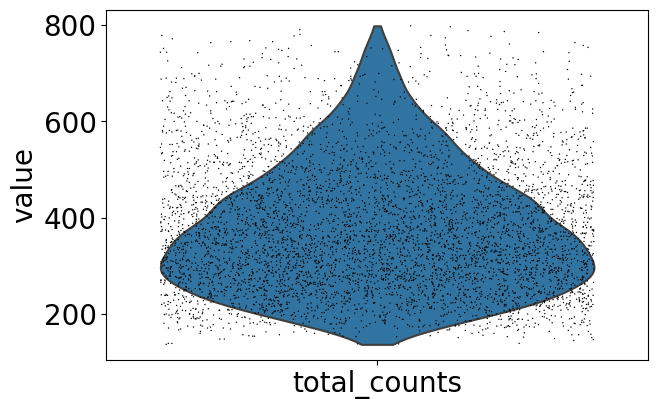

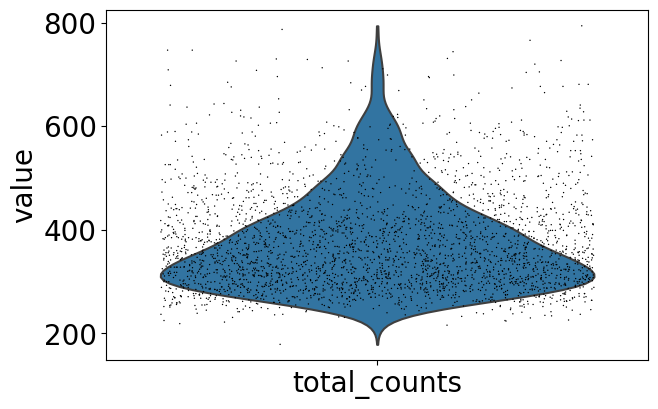

In [25]:
sc.pl.violin(adata[adata.obs['leiden'].isin(['0']),:],["total_counts"],jitter=0.4,)
sc.pl.violin(adata[adata.obs['leiden'].isin(['1']),:],["total_counts"],jitter=0.4,)
sc.pl.violin(adata[adata.obs['leiden'].isin(['2']),:],["total_counts"],jitter=0.4,)
sc.pl.violin(adata[adata.obs['leiden'].isin(['3']),:],["total_counts"],jitter=0.4,)
sc.pl.violin(adata[adata.obs['leiden'].isin(['4']),:],["total_counts"],jitter=0.4,)
sc.pl.violin(adata[adata.obs['leiden'].isin(['5']),:],["total_counts"],jitter=0.4,)
sc.pl.violin(adata[adata.obs['leiden'].isin(['6']),:],["total_counts"],jitter=0.4,)
sc.pl.violin(adata[adata.obs['leiden'].isin(['7']),:],["total_counts"],jitter=0.4,)


In [26]:
#adata
#adata.obs['manualclusters']=adata.obs['leiden'].copy()

#theseclusters=adata.obs['leiden']
#theseclusters.to_csv("C:/Users/lbinan/Desktop/tumor/clusteresnormedtoareafirst.csv",sep=' ')
adatasaved=adata.copy()
theseclusters=adatasaved.obs['leiden']
#theseclusters.to_csv("C:/Users/lbinan/Desktop/tumor/morecells/pythonAllclusters.csv",sep=' ')


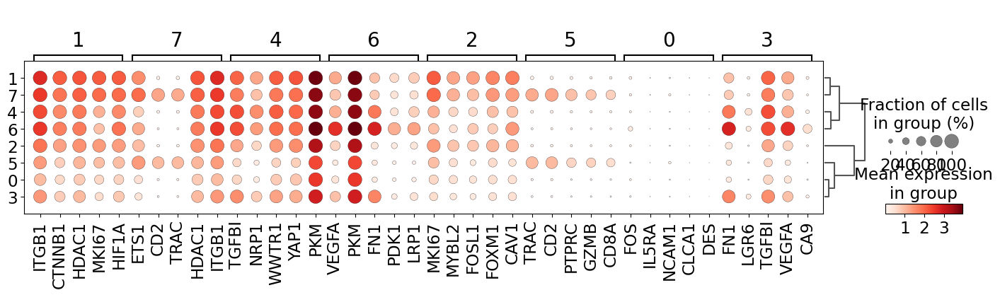

In [27]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='t-test')
sc.tl.dendrogram(adata,n_pcs=30,groupby='leiden')
sc.pl.rank_genes_groups_dotplot(adata,groupby='leiden', n_genes=5)

In [28]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='wilcoxon', key_added = "wilcoxon")
sc.tl.dendrogram(adata,n_pcs=30,groupby='leiden')
#sc.pl.rank_genes_groups_dotplot(filteredadata,groupby='leiden', n_genes=5)
modulessignatureareanorm=pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(15)
modulessignatureareanorm.to_csv("C:/Users/lbinan/Desktop/tumor/morecells/modulesalltumorar.csv")
modulessignatureareanorm

,0,1,2,3,4,5,6,7
0,FOS,ITGB1,MKI67,FN1,TGFBI,TRAC,VEGFA,ETS1
1,IL5RA,CTNNB1,MYBL2,LGR6,NRP1,CD2,PKM,CD2
2,NCAM1,HDAC1,FOSL1,TGFBI,WWTR1,PTPRC,FN1,TRAC
3,CLCA1,MKI67,FOXM1,VEGFA,YAP1,GZMB,PDK1,HDAC1
4,DES,HIF1A,CAV1,CA9,PKM,CD8A,LRP1,ITGB1
5,IL21,PKM,CDK6,PROX1,FN1,ETS1,ITGB1,HIF1A
6,IL1R2,YAP1,PDCD1LG2,FGF1,ITGB1,GZMA,TGFBI,MKI67
7,CXCL5,CAV1,MCM2,SOX2,STAT1,TIGIT,PLOD2,PTPRC
8,CD1B,FOXM1,PKM,MUC4,HDAC1,ITGB2,COL5A1,PKM
9,SLC26A3,STAT1,AMOTL2,CA7,HLA-B,PECAM1,PRKCA,CTNNB1


82.69875


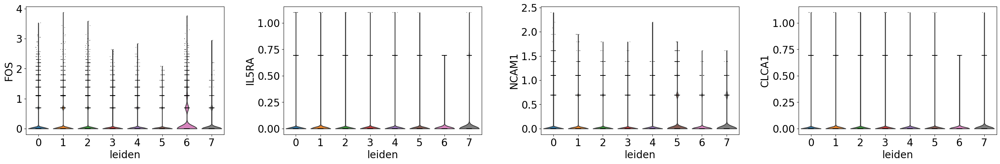

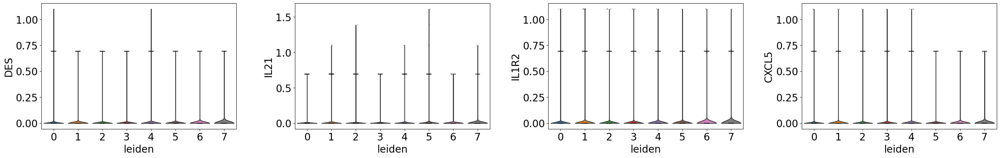

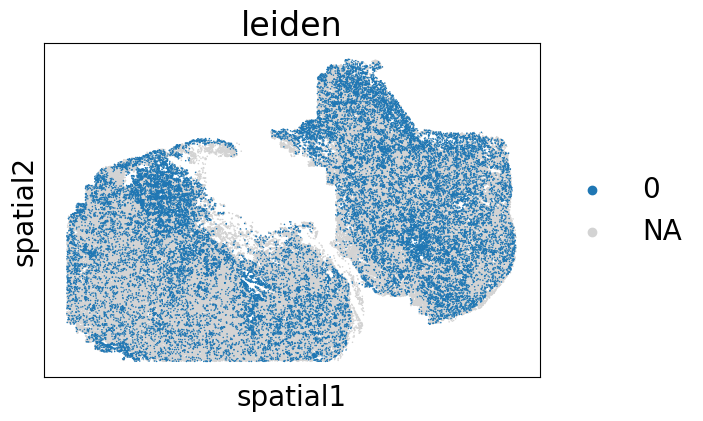

In [29]:
print(np.mean(adata[adata.obs['leiden'].isin(['0']),:].obs['total_counts']))
sc.pl.violin(adata, ['FOS','IL5RA','NCAM1','CLCA1'], groupby='leiden')
sc.pl.violin(adata, ['DES','IL21','IL1R2','CXCL5'], groupby='leiden')
sc.pl.spatial(
    adata,
    color="leiden",
    groups=[
        "0"
    ],
    spot_size=300,
)

431.5896


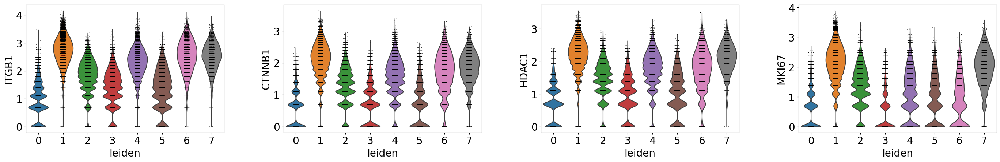

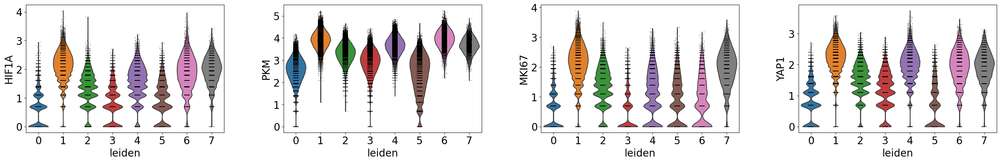

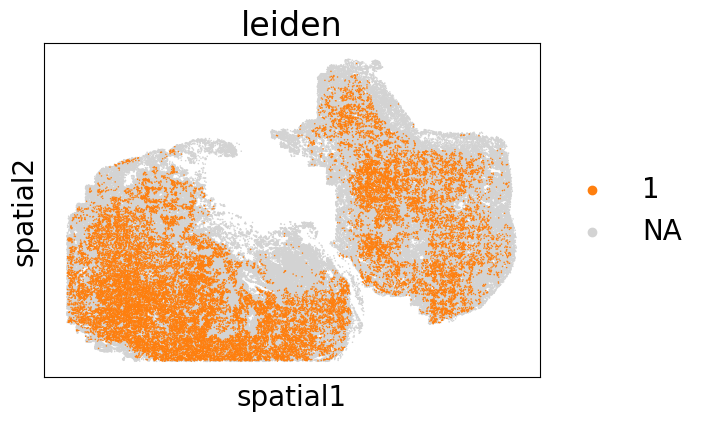

In [30]:
print(np.mean(adata[adata.obs['leiden'].isin(['1']),:].obs['total_counts']))
sc.pl.violin(adata, ['ITGB1','CTNNB1','HDAC1','MKI67'], groupby='leiden')
sc.pl.violin(adata, ['HIF1A','PKM','MKI67','YAP1'], groupby='leiden')
sc.pl.spatial(
    adata,
    color="leiden",
    groups=[
        "1"
    ],
    spot_size=300,
)

195.55281


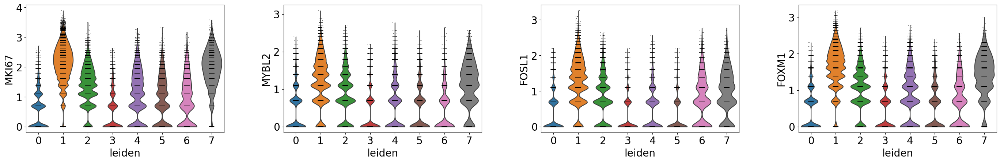

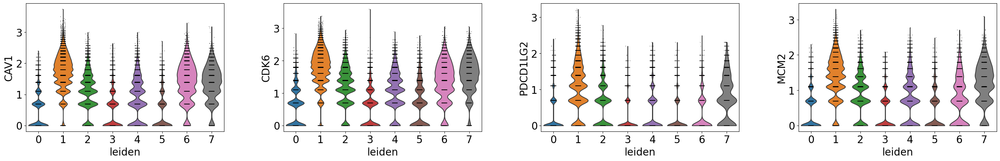

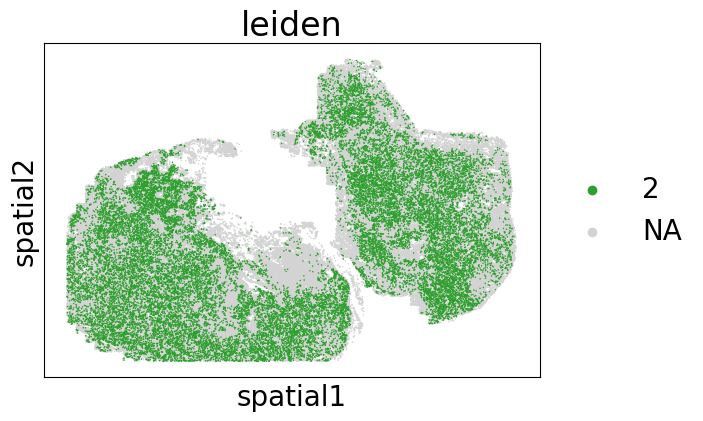

In [31]:
print(np.mean(adata[adata.obs['leiden'].isin(['2']),:].obs['total_counts']))
sc.pl.violin(adata, ['MKI67','MYBL2','FOSL1','FOXM1'], groupby='leiden')
sc.pl.violin(adata, ['CAV1','CDK6','PDCD1LG2','MCM2'], groupby='leiden')
sc.pl.spatial(
    adata,
    color="leiden",
    groups=[
        "2"
    ],
    spot_size=300,
)

123.30011


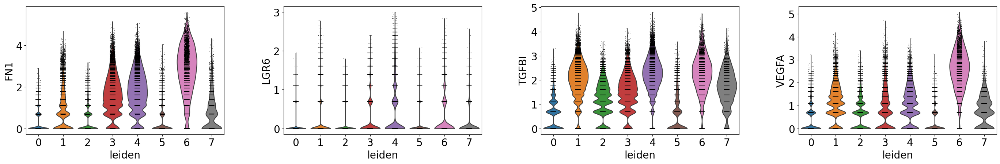

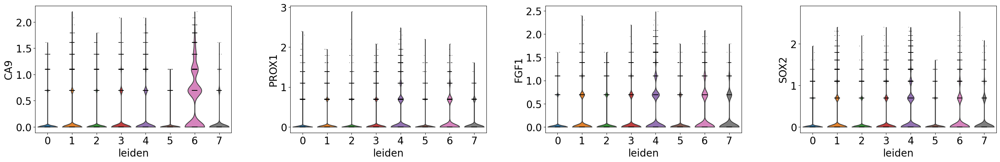

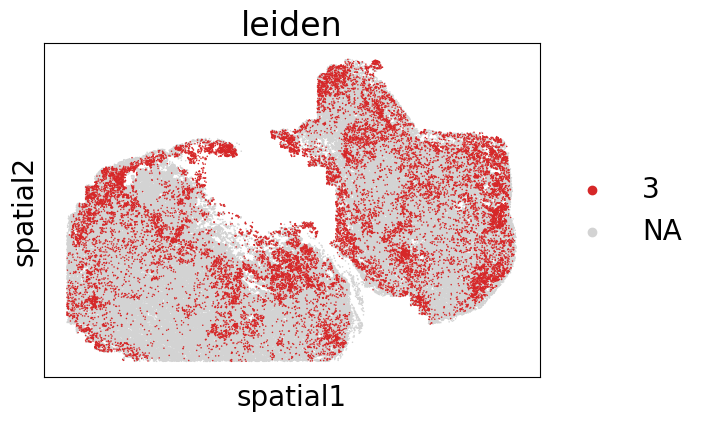

In [32]:
print(np.mean(adata[adata.obs['leiden'].isin(['3']),:].obs['total_counts']))
sc.pl.violin(adata, ['FN1','LGR6','TGFBI','VEGFA'], groupby='leiden')
sc.pl.violin(adata, ['CA9','PROX1','FGF1','SOX2'], groupby='leiden')
sc.pl.spatial(
    adata,
    color="leiden",
    groups=[
        "3"
    ],
    spot_size=300,
)

283.42303


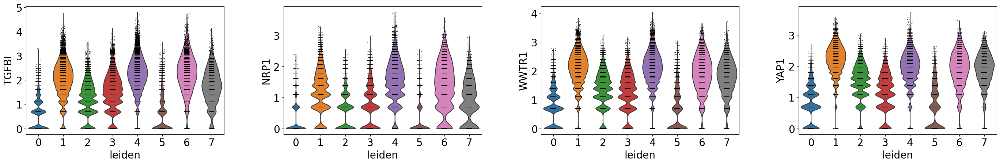

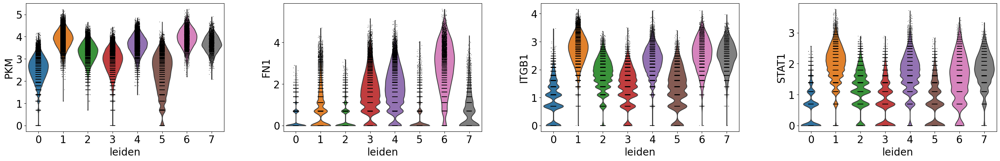

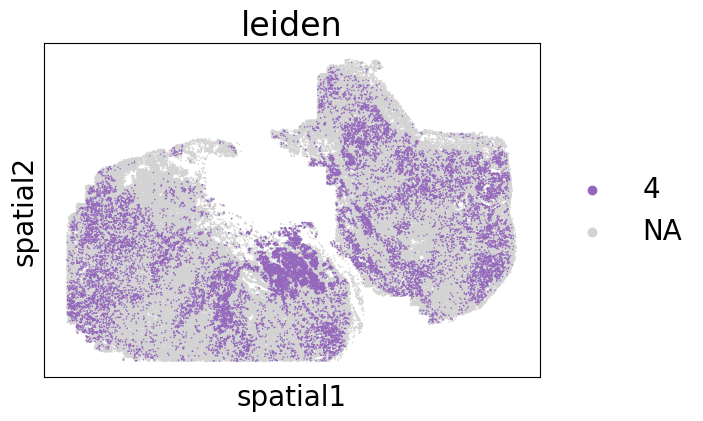

In [33]:
print(np.mean(adata[adata.obs['leiden'].isin(['4']),:].obs['total_counts']))
sc.pl.violin(adata, ['TGFBI','NRP1','WWTR1','YAP1'], groupby='leiden')
sc.pl.violin(adata, ['PKM','FN1','ITGB1','STAT1'], groupby='leiden')
sc.pl.spatial(
    adata,
    color="leiden",
    groups=[
        "4"
    ],
    spot_size=300,
)

131.286


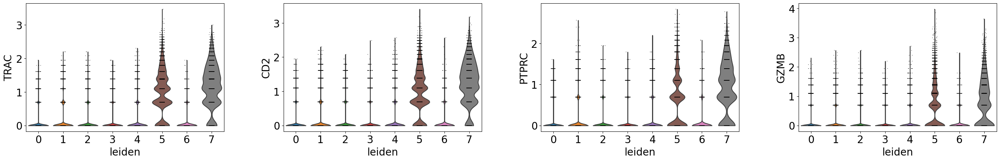

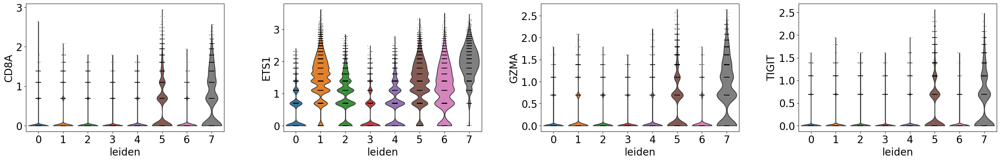

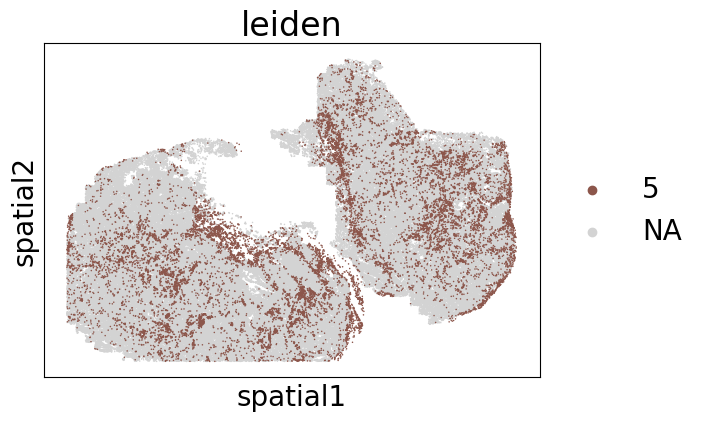

In [27]:
print(np.mean(adata[adata.obs['leiden'].isin(['5']),:].obs['total_counts']))
sc.pl.violin(adata, ['TRAC','CD2','PTPRC','GZMB'], groupby='leiden')
sc.pl.violin(adata, ['CD8A','ETS1','GZMA','TIGIT'], groupby='leiden')
sc.pl.spatial(
    adata,
    color="leiden",
    groups=[
        "5"
    ],
    spot_size=300,
)

377.54153


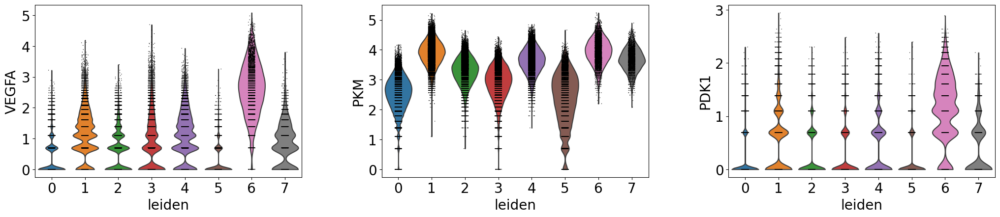

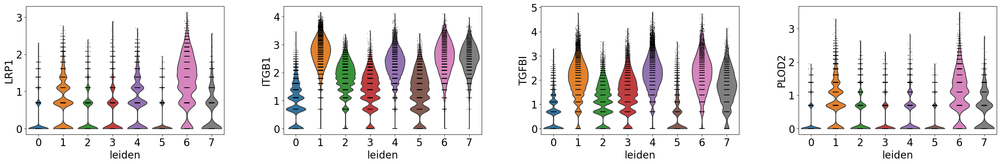

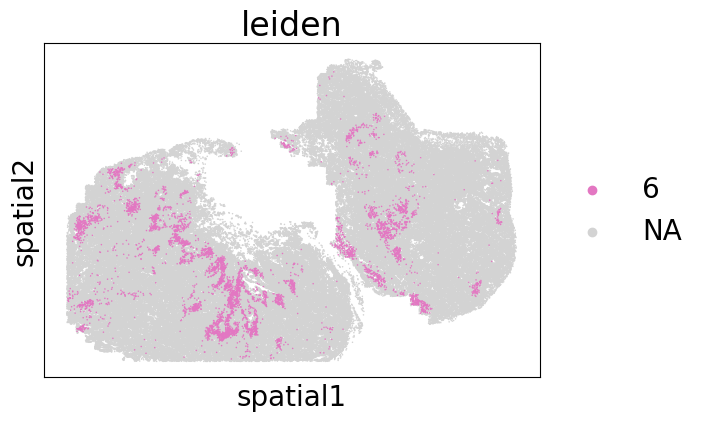

In [35]:
print(np.mean(adata[adata.obs['leiden'].isin(['6']),:].obs['total_counts']))
sc.pl.violin(adata, ['VEGFA','PKM','PKM','PDK1'], groupby='leiden')
sc.pl.violin(adata, ['LRP1','ITGB1','TGFBI','PLOD2'], groupby='leiden')
sc.pl.spatial(
    adata,
    color="leiden",
    groups=[
        "6"
    ],
    spot_size=300,
)

376.46344


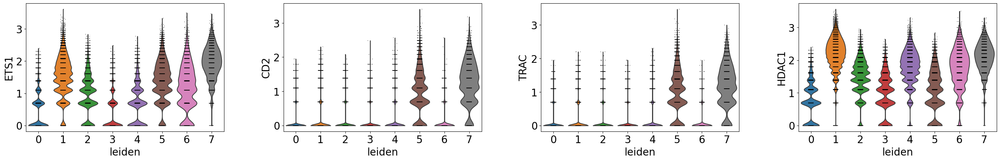

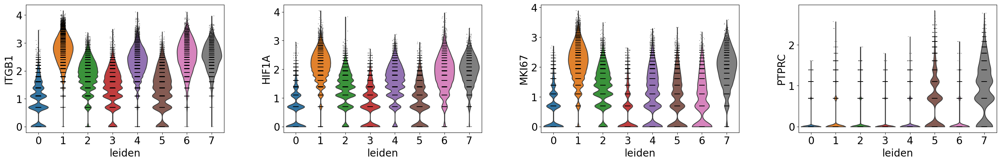

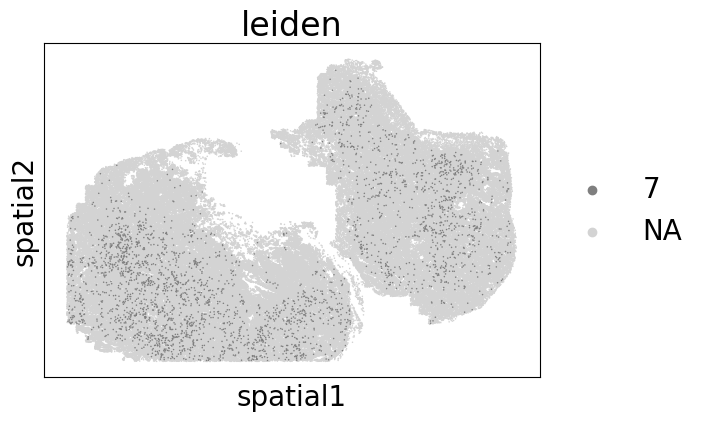

In [26]:
print(np.mean(adata[adata.obs['leiden'].isin(['7']),:].obs['total_counts']))
sc.pl.violin(adata, ['ETS1','CD2','TRAC','HDAC1'], groupby='leiden')
sc.pl.violin(adata, ['ITGB1','HIF1A','MKI67','PTPRC'], groupby='leiden')
sc.pl.spatial(
    adata,
    color="leiden",
    groups=[
        "7"
    ],
    spot_size=300,
)

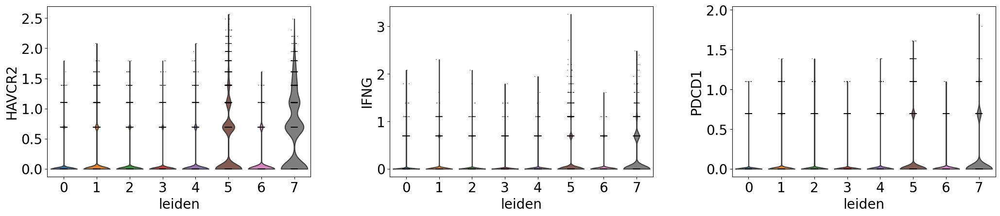

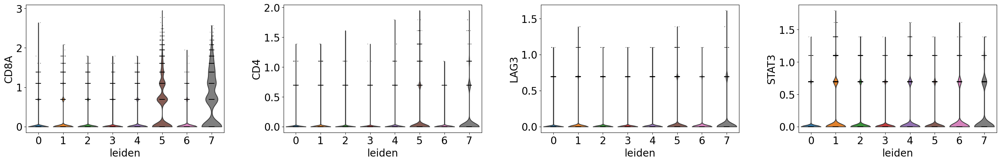

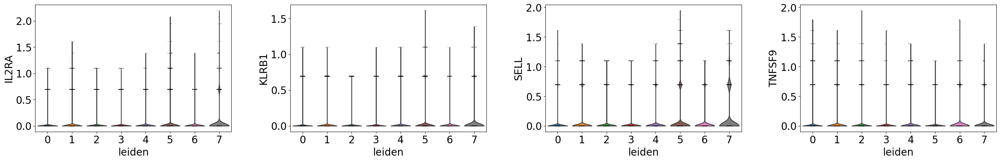

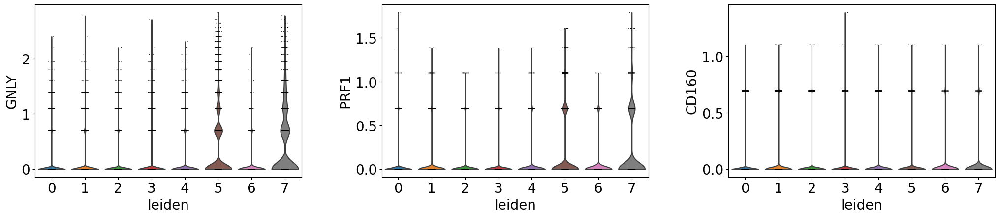

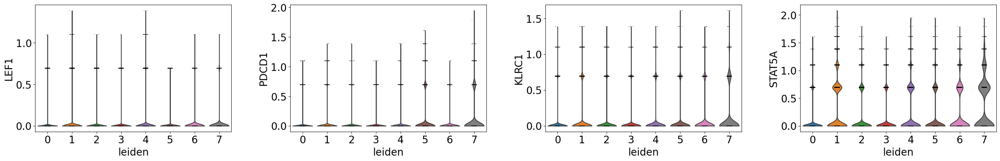

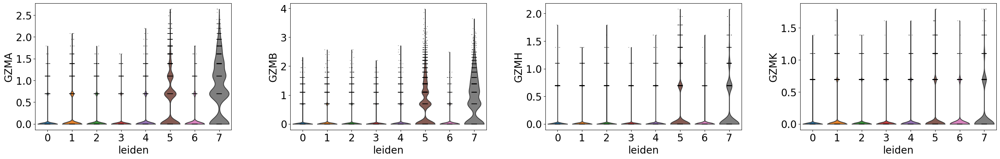

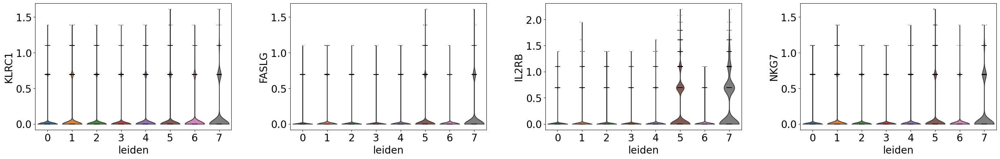

In [37]:
sc.pl.violin(adata, ['HAVCR2','IFNG','PDCD1'], groupby='leiden')
sc.pl.violin(adata, ['CD8A','CD4','LAG3','STAT3'], groupby='leiden')
sc.pl.violin(adata, ['IL2RA','KLRB1','SELL','TNFSF9'], groupby='leiden')
sc.pl.violin(adata, ['GNLY','PRF1','GNLY','CD160'], groupby='leiden')
sc.pl.violin(adata, ['LEF1','PDCD1','KLRC1','STAT5A'], groupby='leiden')
sc.pl.violin(adata, ['GZMA','GZMB','GZMH','GZMK'], groupby='leiden')
sc.pl.violin(adata, ['KLRC1','FASLG','IL2RB','NKG7'], groupby='leiden')


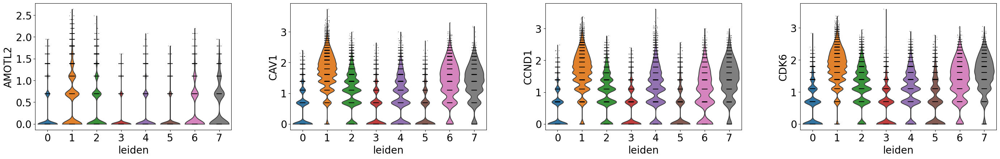

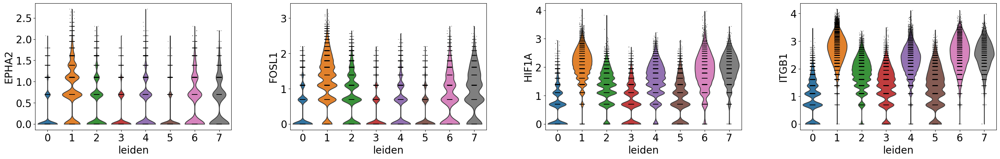

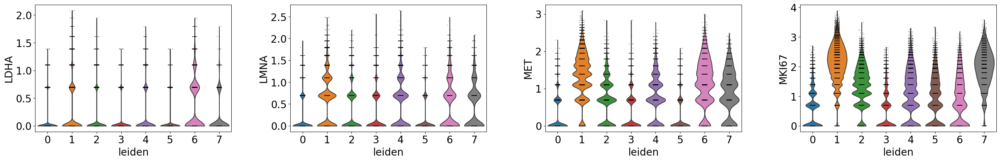

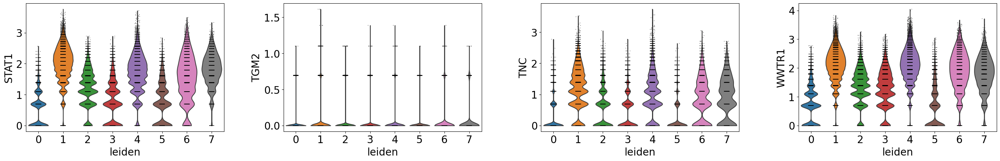

In [38]:
sc.pl.violin(adata, ['AMOTL2','CAV1','CCND1','CDK6'], groupby='leiden')
sc.pl.violin(adata, ['EPHA2','FOSL1','HIF1A','ITGB1'], groupby='leiden')
sc.pl.violin(adata, ['LDHA','LMNA','MET','MKI67'], groupby='leiden')
sc.pl.violin(adata, ['STAT1','TGM2','TNC','WWTR1'], groupby='leiden')

In [39]:
adata=adata[~adata.obs['leiden'].isin(['0']),:]
adata=adata[~adata.obs['leiden'].isin(['7']),:]


In [42]:
adata.obs['manual']=adata.obs['leiden'].astype('str').copy()

Trying to set attribute `.obs` of view, copying.


In [44]:
adata.obs.loc[adata.obs['leiden']=="1",'manual']="Tumor"
adata.obs.loc[adata.obs['leiden']=="2",'manual']="Tumor"
adata.obs.loc[adata.obs['leiden']=="3",'manual']="Tumor 2"
adata.obs.loc[adata.obs['leiden']=="4",'manual']="Tumor 2"
adata.obs.loc[adata.obs['leiden']=="5",'manual']="T-cells"
adata.obs.loc[adata.obs['leiden']=="6",'manual']="Tumor 3"


In [46]:
adata.obs['manual']

1         T-cells
4         T-cells
5           Tumor
7         T-cells
8           Tumor
           ...   
153699    T-cells
153701    T-cells
153702    T-cells
153703    T-cells
153704    T-cells
Name: manual, Length: 120375, dtype: category
Categories (4, object): ['T-cells', 'Tumor', 'Tumor 2', 'Tumor 3']

In [47]:
sc.tl.rank_genes_groups(adata, groupby='manual', method='wilcoxon', key_added = "wilcoxon")
sc.tl.dendrogram(adata,n_pcs=30,groupby='manual')
#sc.pl.rank_genes_groups_dotplot(filteredadata,groupby='leiden', n_genes=5)
modulessignatureareanorm=pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(15)
#modulessignatureareanorm.to_csv("C:/Users/lbinan/Desktop/tumor/morecells/modulesalltumorar.csv")
modulessignatureareanorm

,0,1,2,3,4,5,6,7
0,FOS,ITGB1,MKI67,FN1,TGFBI,TRAC,VEGFA,ETS1
1,IL5RA,CTNNB1,MYBL2,LGR6,NRP1,CD2,PKM,CD2
2,NCAM1,HDAC1,FOSL1,TGFBI,WWTR1,PTPRC,FN1,TRAC
3,CLCA1,MKI67,FOXM1,VEGFA,YAP1,GZMB,PDK1,HDAC1
4,DES,HIF1A,CAV1,CA9,PKM,CD8A,LRP1,ITGB1
5,IL21,PKM,CDK6,PROX1,FN1,ETS1,ITGB1,HIF1A
6,IL1R2,YAP1,PDCD1LG2,FGF1,ITGB1,GZMA,TGFBI,MKI67
7,CXCL5,CAV1,MCM2,SOX2,STAT1,TIGIT,PLOD2,PTPRC
8,CD1B,FOXM1,PKM,MUC4,HDAC1,ITGB2,COL5A1,PKM
9,SLC26A3,STAT1,AMOTL2,CA7,HLA-B,PECAM1,PRKCA,CTNNB1


131.286


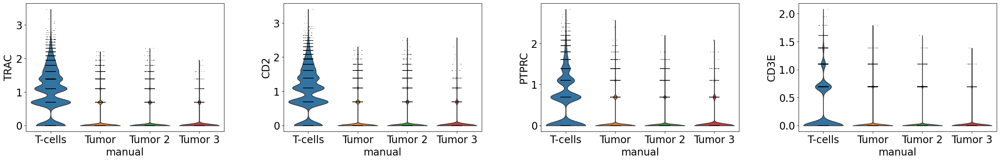

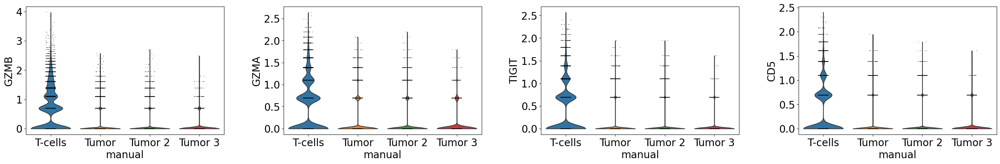

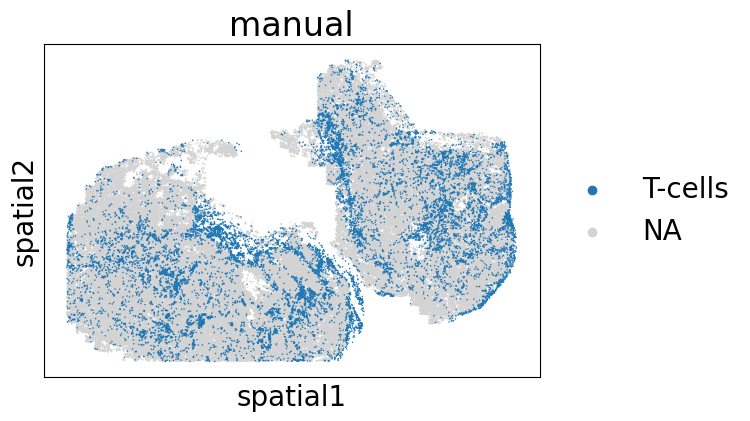

In [49]:
print(np.mean(adata[adata.obs['manual'].isin(['T-cells']),:].obs['total_counts']))
sc.pl.violin(adata, ['TRAC','CD2','PTPRC','CD3E'], groupby='manual')
sc.pl.violin(adata, ['GZMB','GZMA','TIGIT','CD5'], groupby='manual')
sc.pl.spatial(
    adata,
    color="manual",
    groups=[
        "T-cells"
    ],
    spot_size=300,
)

314.4353


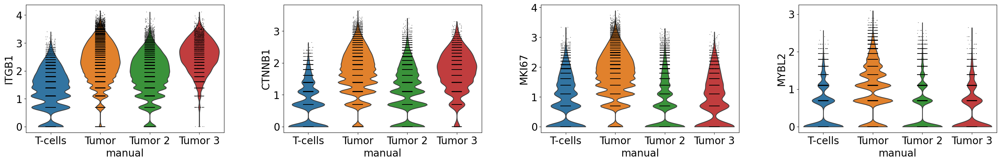

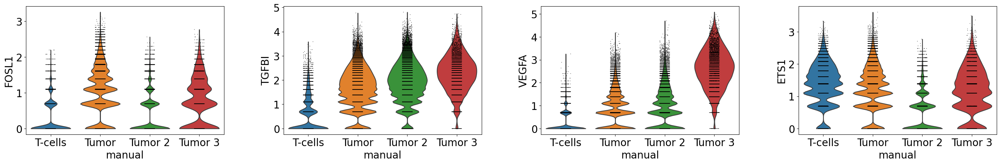

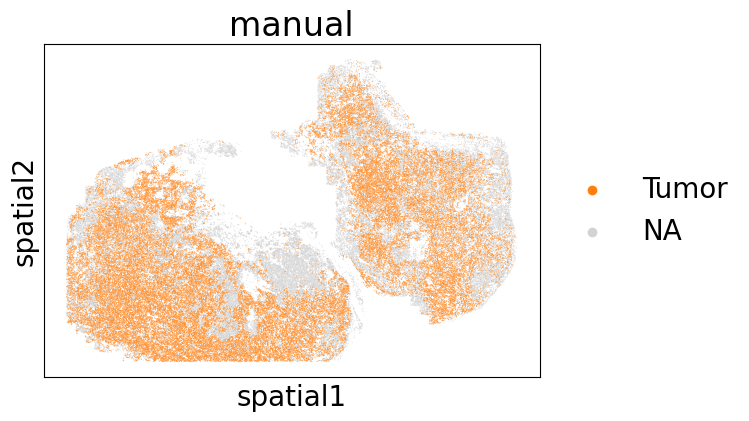

In [51]:
print(np.mean(adata[adata.obs['manual'].isin(['Tumor']),:].obs['total_counts']))
sc.pl.violin(adata, ['ITGB1','CTNNB1','MKI67','MYBL2'], groupby='manual')
sc.pl.violin(adata, ['FOSL1','TGFBI','VEGFA','ETS1'], groupby='manual')
sc.pl.spatial(
    adata,
    color="manual",
    groups=[
        "Tumor"
    ],
    spot_size=150,
)

314.4353


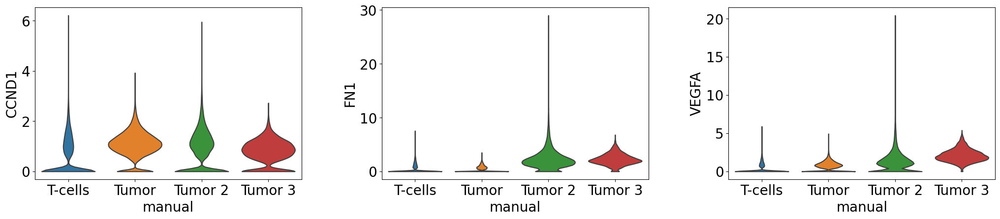

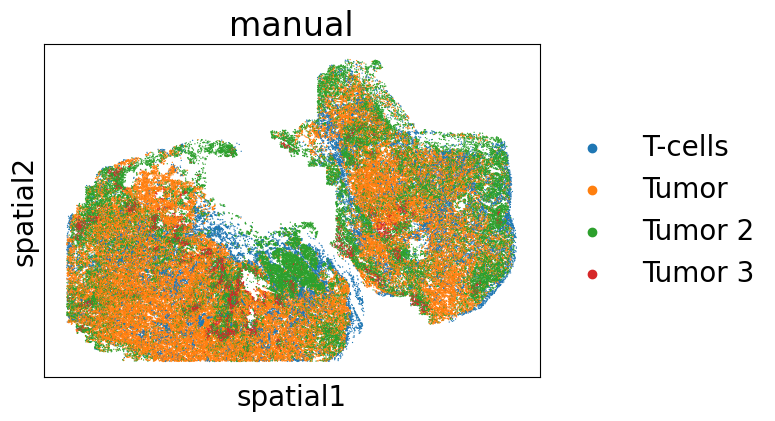

In [71]:
sc.pp.normalize_total(adata)
print(np.mean(adata[adata.obs['manual'].isin(['Tumor']),:].obs['total_counts']))
sc.pl.violin(adata, ['CCND1','FN1','VEGFA'], groupby='manual', stripplot=False, save=True)
#sc.pl.violin(adata, ['PTPRC','TRAC','CD8A'], groupby='manual', stripplot=False, save=True)
sc.pl.spatial(
    adata,
    color="manual",
    groups=[
        "Tumor","Tumor 2","Tumor 3","T-cells"
    ],
    spot_size=250, save=True)